# 부산광역시의 인구가 많은 구 군일수록 의료기관이 많을까?

## 가설
* 인구가 많은 구 군일수록 의료 관련 수요가 많을 것이므로 의료기관이 많을 것이다

## 정의
* 의료기관이란 ?
    * 병원, 의원, 보건소, 약국 등 의료와 관련된 시설을 의료기관이라고 정의한다

In [1]:
# 1. 라이브러리 호출
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import folium
import json

# 2. 시각화 설정
from matplotlib import font_manager, rc
from matplotlib import style
style.use('ggplot')
%matplotlib inline

# 3. 한글폰트를 설정
font_name = font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name()
rc('font', family=font_name)

# 4. 해상도
from IPython.display import set_matplotlib_formats
set_matplotlib_formats("retina")

In [2]:
human_path = f'data/부산시 주민등록인구 통계정보 서비스.xlsx'
hospital_path = f'data/부산광역시_의료기관 현황.xlsx'

# 부산광역시 인구수 전처리

In [3]:
def human_preprocessing(path):
    human_raw = pd.read_excel(human_path)
    human_data = human_raw[human_raw['제공연도'] == '2020-03'].copy()
    human_data = human_data[['구군','총인구수','시 전체 인구비율']]
    human_data.columns = ['구군','인구수','인구비율']
    human_data = human_data[human_data['구군'] != '부산광역시']

    def get_province(x):
        temp = x.split(' ')[0]
        if len(temp) != 4:
            return temp[:2]
        else:
            return temp[0] + temp[2]
    
    human_data['시'] = human_data['구군'].dropna().apply(get_province)
    human_data['구'] = human_data['구군'].dropna().apply(lambda x: x.split(' ')[1])
    
    return human_data

In [4]:
human_df = human_preprocessing(human_path)
human_df

,구군,인구수,인구비율,시,구
35,부산광역시 중구,44031,1.3,부산,중구
36,부산광역시 서구,109756,3.2,부산,서구
37,부산광역시 동구,91585,2.6,부산,동구
38,부산광역시 영도구,117765,3.4,부산,영도구
39,부산광역시 부산진구,359790,10.4,부산,부산진구
40,부산광역시 동래구,273573,7.9,부산,동래구
41,부산광역시 남구,278619,8.0,부산,남구
42,부산광역시 북구,292106,8.4,부산,북구
43,부산광역시 해운대구,410223,11.9,부산,해운대구
44,부산광역시 사하구,323758,9.4,부산,사하구


# 구군별 인구수 시각화

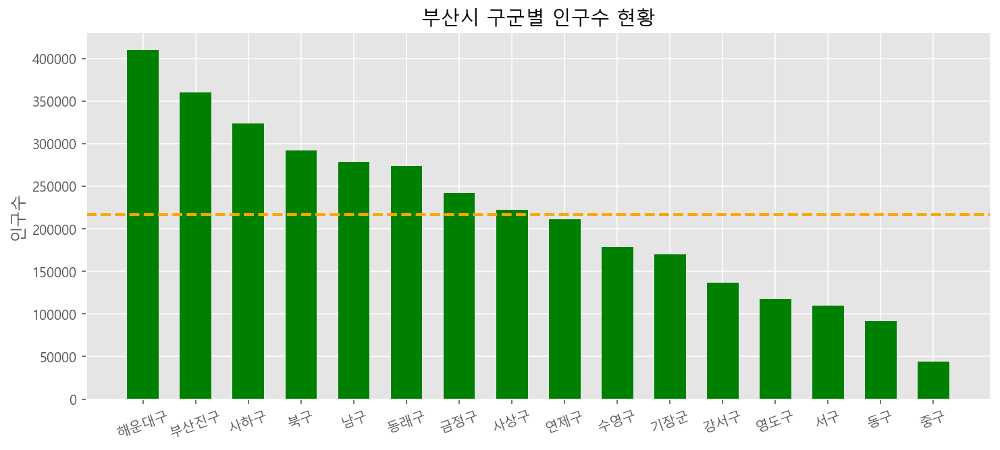

In [5]:
human_df = human_df.groupby('구').sum().sort_values(by = '인구수', ascending = False)
plt.figure(figsize=(12, 5))
plt.bar(human_df.index, human_df['인구수'],color = 'green', width = 0.6)
plt.xticks(rotation = 20)
plt.axhline(human_df['인구수'].mean(), color='orange', linewidth=2, linestyle='--')
plt.ylabel('인구수')
plt.title('부산시 구군별 인구수 현황')
plt.show()

# 부산광역시 의료기관 현항 전처리

In [6]:
def hospital_preprocessing(path):
    hospital_raw = pd.read_excel(hospital_path)
    hospital_data = hospital_raw[['기관명', '기관분류','기관주소(도로명)','WGS84좌표(경도)','WGS84좌표(위도)']].copy()
    hospital_data.columns = ['의료기관','분류','주소','경도','위도']

    def get_province(x):
        temp = x.split(' ')[0]
        if len(temp) != 4:
            return temp[:2]
        else:
            return temp[0] + temp[2]
    
    hospital_data['시'] = hospital_data['주소'].dropna().apply(get_province)
    hospital_data['구'] = hospital_data['주소'].dropna().apply(lambda x: x.split(' ')[1])
    
    # 잘못된 경도 위도 처리 (지도상에서 부산시로 위치가 찍히지 않은 곳들)
    hospital_data[hospital_data['의료기관'] == '화신약국']
    hospital_data.at[1141,'경도'] = '129.088358' 
    hospital_data.at[1141,'위도'] = '35.220684'

    hospital_data[hospital_data['의료기관'] == '송산한의원']
    hospital_data.at[480,'경도'] = '129.023043' 
    hospital_data.at[480,'위도'] = '35.097748'

    hospital_data[hospital_data['의료기관'] == '참조은이비인후과의원']
    hospital_data.at[4320,'경도'] = '128.999364' 
    hospital_data.at[4320,'위도'] = '35.090302'
    
    hospital_data[hospital_data['의료기관'] == '강약국']
    hospital_data.at[2613,'경도'] = '129.085940' 
    hospital_data.at[2613,'위도'] = '35.183600'
    
    hospital_data[hospital_data['의료기관'] == '드림약국']
    hospital_data.at[2278,'경도'] = '129.098512' 
    hospital_data.at[2278,'위도'] = '35.216894'
    
    hospital_data[hospital_data['의료기관'] == '하루미치과의원']
    hospital_data.at[2760,'경도'] = '129.092869' 
    hospital_data.at[2760,'위도'] = '35.135176'
    
    hospital_data[hospital_data['의료기관'] == '굿모닝약국']
    hospital_data.at[2554,'경도'] = '129.104804' 
    hospital_data.at[2554,'위도'] = '35.214613'
    
    hospital_data[hospital_data['의료기관'] == '덕성치과의원']
    hospital_data.at[3686,'경도'] = '128.982181' 
    hospital_data.at[3686,'위도'] = '35.140627'
    
    hospital_data[hospital_data['의료기관'] == '송정약국']
    hospital_data.at[1824,'경도'] = '129.204003' 
    hospital_data.at[1824,'위도'] = '35.182858'
    
    hospital_data[hospital_data['의료기관'] == '밝은이치과의원']
    hospital_data.at[3479,'경도'] = '129.049107' 
    hospital_data.at[3479,'위도'] = '35.157652'
    
    hospital_data[hospital_data['의료기관'] == '우신약국']
    hospital_data.at[1546,'경도'] = '129.037657' 
    hospital_data.at[1546,'위도'] = '35.209365'
    
    hospital_data[hospital_data['의료기관'] == '웰빙내과의원']
    hospital_data.at[4796,'경도'] = '129.108522' 
    hospital_data.at[4796,'위도'] = '35.163110'
    
    hospital_data[hospital_data['의료기관'] == '대학약국']
    hospital_data.at[2377,'경도'] = '129.020692' 
    hospital_data.at[2377,'위도'] = '35.147731'
    
    return hospital_data

In [7]:
hospital_data = hospital_preprocessing(hospital_path)
hospital_data

,의료기관,분류,주소,경도,위도,시,구
0,의료법인은성의료재단좋은삼선병원,종합병원,부산광역시 사상구 가야대로 326 (주례동),129.008198,35.150568,부산,사상구
1,해은한의원,한의원,"부산광역시 금정구 중앙대로 1943, 2층 (구서동, 첨단빌딩)",129.091082,35.257891,부산,금정구
2,해인한의원,한의원,부산광역시 기장군 정관면 구연방곡로 11,129.184033,35.320628,부산,기장군
3,해인한의원,한의원,"부산광역시 금정구 부곡로 131, 1,2층 (부곡동)",129.091870,35.227660,부산,금정구
4,해인한의원,한의원,"부산광역시 부산진구 동평로 404, 3층 (양정동)",129.068994,35.173760,부산,부산진구
...,...,...,...,...,...,...,...
4995,애플의원,의원,"부산광역시 사상구 사상로 201, 5층 (괘법동)",128.984152,35.162632,부산,사상구
4996,앤유의원,의원,"부산광역시 부산진구 서면로 74, 11층 (부전동, 아이온시티빌딩)",129.058057,35.157034,부산,부산진구
4997,양내과의원,의원,부산광역시 사하구 낙동대로 447 (하단동),128.969512,35.104832,부산,사하구
4998,양성연내과의원,의원,"부산광역시 남구 분포로 115, A동 3층 303호 (용호동, 힐탑탑플레이스)",129.112723,35.132190,부산,남구


In [8]:
hospital_sum = hospital_data.groupby('구').count()['의료기관']
hospital_sum = hospital_sum.reset_index().groupby('구').sum()
hospital_sum.columns = ['의료기관 수']

In [9]:
gu_mean = hospital_data.pivot_table(index = '구', values =['경도','위도'], aggfunc = 'mean')
hospital_sum['경도'] = gu_mean['경도']
hospital_sum['위도'] = gu_mean['위도']
hospital_df = hospital_sum.sort_values(by = '의료기관 수', ascending = False)

# 구군별 의료기관 수 시각화

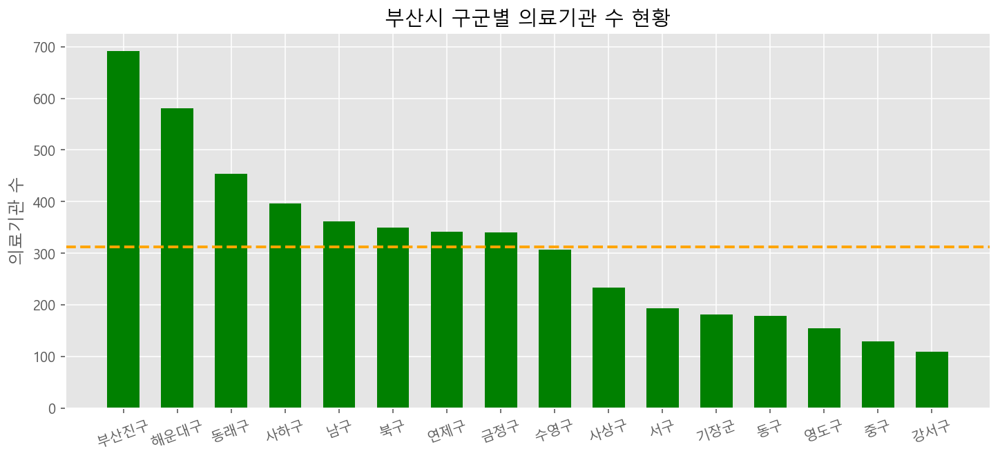

In [10]:
plt.figure(figsize=(12, 5))
plt.bar(hospital_df.index, hospital_df['의료기관 수'], color = 'green', width = 0.6)
plt.xticks(rotation = 20)
plt.axhline(hospital_df['의료기관 수'].mean(), color='orange', linewidth=2, linestyle='--')
plt.ylabel('의료기관 수')
plt.title('부산시 구군별 의료기관 수 현황')
plt.show()

In [11]:
human_df['의료기관 수'] = hospital_df['의료기관 수']
human_df['경도'] = hospital_df['경도']
human_df['위도'] = hospital_df['위도']
project_df = human_df.sort_values(by = '인구수', ascending = False)
project_df

,인구수,인구비율,의료기관 수,경도,위도
구,,,,,
해운대구,410223,11.9,581,129.151176,35.180001
부산진구,359790,10.4,692,129.051442,35.159712
사하구,323758,9.4,396,128.977877,35.091225
북구,292106,8.4,349,129.012566,35.218663
남구,278619,8.0,362,129.094512,35.129997
동래구,273573,7.9,454,129.081505,35.203360
금정구,242147,7.0,340,129.092918,35.238798
사상구,221983,6.4,233,128.987818,35.157337
연제구,211385,6.1,342,129.084677,35.184559


#  인구수와 의료기관 수 상관관계 시각화

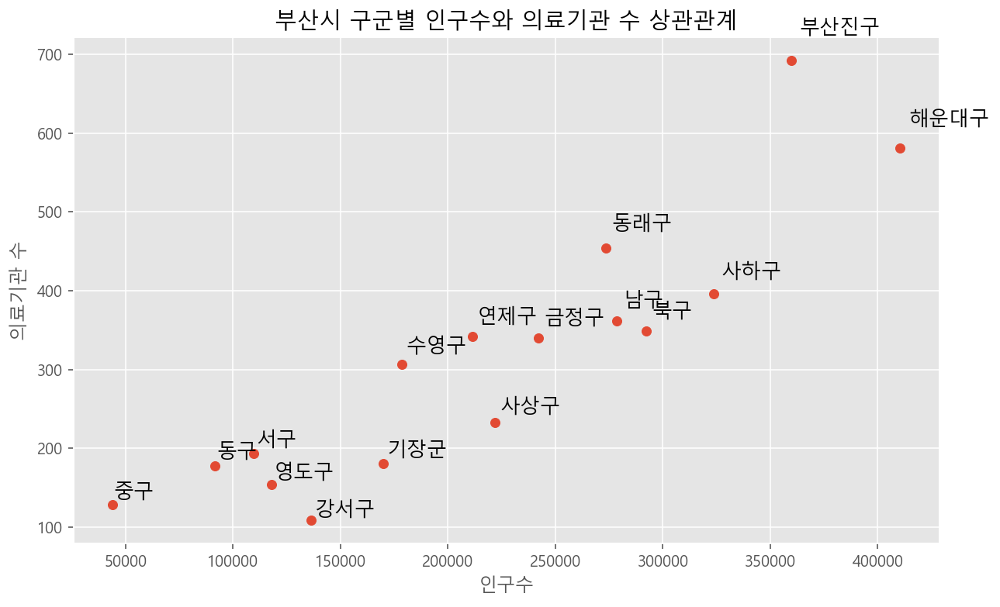

In [12]:
plt.figure(figsize=(10,6))

x = project_df['인구수']
y = project_df['의료기관 수']

for name in project_df.index:
    plt.text(project_df['인구수'][name]*1.01, project_df['의료기관 수'][name]*1.05, name, fontsize=13)

plt.scatter(x, y)
plt.xlabel('인구수')
plt.ylabel('의료기관 수')
plt.title('부산시 구군별 인구수와 의료기관 수 상관관계')
plt.show();

# GeoJson을 이용하여 부산시 의료기관 위치  및 구군별 인구수 시각화

## 의료기관 위치 지도에 출력

In [13]:
geo_path = f'data/pusan_municipalities_geo_simple.json'
geo_json = json.load(open(geo_path, encoding='utf-8'))

In [14]:
project_df = project_df.reset_index()

In [15]:
long = hospital_data['경도'].mean()
lat = hospital_data['위도'].mean()
m = folium.Map(location=[lat, long], zoom_start=11)

In [16]:
for i in hospital_data.index:
    circle_lat = hospital_data.loc[i, '위도']
    circle_long = hospital_data.loc[i, '경도']
    title = f"{hospital_data.loc[i,'의료기관']} - {hospital_data.loc[i,'주소']}"
    folium.CircleMarker(location=[circle_lat, circle_long], radius=4, color="blue",tooltip = title).add_to(m)
m

In [17]:
folium.Choropleth(
    geo_data=geo_json,
    name='인구수',
    data=project_df,
    columns=['구','인구수'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='부산시 인구수와 의료기관 수 비교'
).add_to(m)

In [18]:
project_df

,구,인구수,인구비율,의료기관 수,경도,위도
0,해운대구,410223,11.9,581,129.151176,35.180001
1,부산진구,359790,10.4,692,129.051442,35.159712
2,사하구,323758,9.4,396,128.977877,35.091225
3,북구,292106,8.4,349,129.012566,35.218663
4,남구,278619,8.0,362,129.094512,35.129997
5,동래구,273573,7.9,454,129.081505,35.203360
6,금정구,242147,7.0,340,129.092918,35.238798
7,사상구,221983,6.4,233,128.987818,35.157337
8,연제구,211385,6.1,342,129.084677,35.184559
9,수영구,178715,5.2,307,129.112087,35.158109


## 구군별 인구수 및 의료기관 수 지도에 출력

In [19]:
for i in project_df.index:
    sub_long = project_df.loc[i, '경도']
    sub_lat = project_df.loc[i, '위도']
    
        
    gu = project_df.loc[i, "구"]
    tooltip = f"{gu} : {project_df.loc[i,'의료기관 수']}"
        
    radius = np.sqrt(project_df.loc[i,'의료기관 수']) * 1.3
            
    folium.CircleMarker([sub_lat, sub_long],
                        radius=radius,
                        color='blue',
                        fill=True,
                        tooltip=tooltip,
                        ).add_to(m)       
m

In [20]:
m.save('project.html')